## 필요 라이브러리 호출

In [35]:
import os
import pandas as pd
pd.set_option('display.max_colwidth', None)
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib import rc
from wordcloud import WordCloud
import re
import requests
import plotly.express as px
import numpy as np
from PIL import Image

from collections import Counter
from pyspark.sql.functions import col, to_timestamp
import pymysql
import mysql.connector
from tqdm import tqdm
import kss
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType
from konlpy.tag import Okt, Mecab
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from pyspark.sql.functions import col, to_timestamp
from transformers import AutoTokenizer, AutoModel, AutoModelForSequenceClassification, pipeline
import torch

## 폰트 설정

In [5]:
font_list = fm.findSystemFonts(fontpaths = None, fontext = 'ttf')
font_list[:]

['/usr/share/fonts/truetype/noto/NotoSansCanadianAboriginal-Regular.ttf',
 '/usr/share/fonts/truetype/noto/NotoNastaliqUrdu-Regular.ttf',
 '/usr/share/fonts/truetype/noto/NotoSerifEthiopic-Bold.ttf',
 '/usr/share/fonts/truetype/noto/NotoSansOriya-Bold.ttf',
 '/usr/share/fonts/truetype/noto/NotoKufiArabic-Bold.ttf',
 '/usr/share/fonts/truetype/dejavu/DejaVuSansMono-Oblique.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSerif-Bold.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf',
 '/usr/share/fonts/truetype/noto/NotoSansMyanmar-Bold.ttf',
 '/usr/share/fonts/truetype/noto/NotoSansShavian-Regular.ttf',
 '/usr/share/fonts/truetype/noto/NotoSansTagalog-Regular.ttf',
 '/usr/share/fonts/truetype/noto/NotoSansNKo-Regular.ttf',
 '/usr/share/fonts/truetype/noto/NotoSerifHebrew-Regular.ttf',
 '/usr/share/fonts/truetype/noto/NotoSansTagbanwa-Regular.ttf',
 '/usr/share/fonts/truetype/noto/NotoSansBuhid-Regular.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicBold.tt

In [6]:
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'

font = fm.FontProperties(fname=font_path).get_name()
rc('font', family=font)

## MySQL에서 데이터 불러오기

In [7]:
os.environ['PYSPARK_PYTHON'] = '/home/ubuntu/anaconda3/envs/Project/bin/python'
os.environ['PYSPARK_DRIVER_PYTHON'] = '/home/ubuntu/anaconda3/envs/Project/bin/python'
os.environ['PYSPARK_SUBMIT_ARGS'] = '--jars /usr/local/lib/mysql-connector-java-5.1.49-bin.jar pyspark-shell'

In [8]:
host_ip = "15.168.221.131"  
DATABASE = "SNS_DB"
user_id = "lab13"
user_password = "lab13"
mysql_url = f"jdbc:mysql://{host_ip}:3306/{DATABASE}"

In [9]:
table_name = "tbCrawled_Danawa"
connection = mysql.connector.connect(
    host='localhost',
    user='lab13',
    password='lab13',
    database='SNS_DB',
    charset='utf8mb4'
)
cursor = connection.cursor()
cursor.execute(f"SELECT * FROM {table_name} LIMIT 10;") 
rows = cursor.fetchall()
for row in rows:
    print(row)

('80점', '삼성닷컴', '2024.06.10.', '\n모친 폰으로 구매 하였습니다. 모친께 저는 그간 엘지제품과 삼성제...\n', '모친 폰으로 구매 하였습니다. \n\n모친께 저는 그간 엘지제품과 삼성제품을 2-3년에 한 번씩 바꾸어 사용하도록 했었습니다. 엘지제품이 나오지 않고나서부터는 삼성제품의 폴드3에디션을 사용하시도록 했었습니다.\n\n에디션이라는 이벤트가 특별했고 화면도 넓고 사진도 잘나온다 소문나 늘 지인분들과의 추억은 모친의 휴대전화에 먼저 저장이 되고는 했었습니다. 그런데 언제부턴가 사진에는 뿌연 현상이 생겼고, 접히는 부분이 눈에 띄게 미워보이기 시작했고 서비스센터에서 교체를 받았음에도 느려짐과 카메라의 불편한 현상은 나아지질 않았죠 거기에 손목이 이제는 아프다는 모친의 말씀을 듣고 플립과 고민을 하다가 \n\n이번 시리즈 제품을 구매하게 되었습니다. 울트라 사양은 아니더라도 플러스 사양으로 해 드리려던 걸 단순 무게 차이를 위해 일반으로 선택했고, 조금 더 특별함을 느끼실까하여 오렌지 색상으로 선택했습니다. \n\n무게, 크기, 번역기능, 편집기능, 카메라, 시계연동 관심을 갖고 확인하시던 부분입니다. 그리고 평소 CCTv 앱을 사용하시곤 하는데 실행 할때 폴드 3때보다 그 부분도 원할하게 사용 가능 하시다고 하네요. \n데이터를 옮기는 과정도 99% 에서 넘어가지를 않아서 기다리는 시간이 삼십분을 넘겼지만 재실행을 해보고 나니 빠른편은 아니더라도 깔끔한 편이었습니다. \n\n삼성제품은 유달리 안내서가 꼼꼼하여 천천히 읽어보면 모두가 이해하고 따라 갈 수 있지만 실상 그 안내서를 다 읽기는 버거움은 있습니다. 필요한 부분은 찾기 버튼을 눌러 찾아서 설정기능이 있어 편하기도 했습니다. \n\n그리고 색달랐던 점은 데이터 넘어오기를 할 때 키보드 설정에 대해서는 시스템설정이 그대로 넘어오지는 않더라구요 예를들어 천지인으로 설정한걸 새 기기에 천지인으로 그대로 설정되지 않는 현상 이 부분은 보안상의 이유로 제외하고 읽어들인걸까요?\n\n

In [10]:
cursor.execute(f"SELECT COUNT(*) FROM {table_name};")
count = cursor.fetchone()[0]
count 

17632

In [11]:
# 먼저 테이블의 컬럼을 조회해서 리스트로 가져오기
cursor.execute(f"SHOW COLUMNS FROM {table_name};")
columns = [column[0] for column in cursor.fetchall()]

# id를 가장 앞으로, inserted_at을 가장 뒤로 정렬
if "id" in columns:
    columns.remove("id")
    columns.insert(0, "id")

if "inserted_at" in columns:
    columns.remove("inserted_at")
    columns.append("inserted_at")

query = f"SELECT {', '.join(columns)} FROM {table_name};"
cursor.execute(query)

# 데이터 가져오기
data = cursor.fetchall()
data  

[(1,
  '80점',
  '삼성닷컴',
  '2024.06.10.',
  '\n모친 폰으로 구매 하였습니다. 모친께 저는 그간 엘지제품과 삼성제...\n',
  '모친 폰으로 구매 하였습니다. \n\n모친께 저는 그간 엘지제품과 삼성제품을 2-3년에 한 번씩 바꾸어 사용하도록 했었습니다. 엘지제품이 나오지 않고나서부터는 삼성제품의 폴드3에디션을 사용하시도록 했었습니다.\n\n에디션이라는 이벤트가 특별했고 화면도 넓고 사진도 잘나온다 소문나 늘 지인분들과의 추억은 모친의 휴대전화에 먼저 저장이 되고는 했었습니다. 그런데 언제부턴가 사진에는 뿌연 현상이 생겼고, 접히는 부분이 눈에 띄게 미워보이기 시작했고 서비스센터에서 교체를 받았음에도 느려짐과 카메라의 불편한 현상은 나아지질 않았죠 거기에 손목이 이제는 아프다는 모친의 말씀을 듣고 플립과 고민을 하다가 \n\n이번 시리즈 제품을 구매하게 되었습니다. 울트라 사양은 아니더라도 플러스 사양으로 해 드리려던 걸 단순 무게 차이를 위해 일반으로 선택했고, 조금 더 특별함을 느끼실까하여 오렌지 색상으로 선택했습니다. \n\n무게, 크기, 번역기능, 편집기능, 카메라, 시계연동 관심을 갖고 확인하시던 부분입니다. 그리고 평소 CCTv 앱을 사용하시곤 하는데 실행 할때 폴드 3때보다 그 부분도 원할하게 사용 가능 하시다고 하네요. \n데이터를 옮기는 과정도 99% 에서 넘어가지를 않아서 기다리는 시간이 삼십분을 넘겼지만 재실행을 해보고 나니 빠른편은 아니더라도 깔끔한 편이었습니다. \n\n삼성제품은 유달리 안내서가 꼼꼼하여 천천히 읽어보면 모두가 이해하고 따라 갈 수 있지만 실상 그 안내서를 다 읽기는 버거움은 있습니다. 필요한 부분은 찾기 버튼을 눌러 찾아서 설정기능이 있어 편하기도 했습니다. \n\n그리고 색달랐던 점은 데이터 넘어오기를 할 때 키보드 설정에 대해서는 시스템설정이 그대로 넘어오지는 않더라구요 예를들어 천지인으로 설정한걸 새 기기에 천지인으로 그대로 설정되지 않는 현상 이 부분은 보안상의 이유로 제외하

In [12]:
query = f"SELECT {', '.join(columns)} FROM {table_name};"
cursor.execute(query)

data = cursor.fetchall()
df = pd.DataFrame(data, columns=columns)
df.head()

,id,scoring,market,purchasing_date,review_title,review_content,item,inserted_at
0,1,80점,삼성닷컴,2024.06.10.,\n모친 폰으로 구매 하였습니다. 모친께 저는 그간 엘지제품과 삼성제...\n,"모친 폰으로 구매 하였습니다. \n\n모친께 저는 그간 엘지제품과 삼성제품을 2-3년에 한 번씩 바꾸어 사용하도록 했었습니다. 엘지제품이 나오지 않고나서부터는 삼성제품의 폴드3에디션을 사용하시도록 했었습니다.\n\n에디션이라는 이벤트가 특별했고 화면도 넓고 사진도 잘나온다 소문나 늘 지인분들과의 추억은 모친의 휴대전화에 먼저 저장이 되고는 했었습니다. 그런데 언제부턴가 사진에는 뿌연 현상이 생겼고, 접히는 부분이 눈에 띄게 미워보이기 시작했고 서비스센터에서 교체를 받았음에도 느려짐과 카메라의 불편한 현상은 나아지질 않았죠 거기에 손목이 이제는 아프다는 모친의 말씀을 듣고 플립과 고민을 하다가 \n\n이번 시리즈 제품을 구매하게 되었습니다. 울트라 사양은 아니더라도 플러스 사양으로 해 드리려던 걸 단순 무게 차이를 위해 일반으로 선택했고, 조금 더 특별함을 느끼실까하여 오렌지 색상으로 선택했습니다. \n\n무게, 크기, 번역기능, 편집기능, 카메라, 시계연동 관심을 갖고 확인하시던 부분입니다. 그리고 평소 CCTv 앱을 사용하시곤 하는데 실행 할때 폴드 3때보다 그 부분도 원할하게 사용 가능 하시다고 하네요. \n데이터를 옮기는 과정도 99% 에서 넘어가지를 않아서 기다리는 시간이 삼십분을 넘겼지만 재실행을 해보고 나니 빠른편은 아니더라도 깔끔한 편이었습니다. \n\n삼성제품은 유달리 안내서가 꼼꼼하여 천천히 읽어보면 모두가 이해하고 따라 갈 수 있지만 실상 그 안내서를 다 읽기는 버거움은 있습니다. 필요한 부분은 찾기 버튼을 눌러 찾아서 설정기능이 있어 편하기도 했습니다. \n\n그리고 색달랐던 점은 데이터 넘어오기를 할 때 키보드 설정에 대해서는 시스템설정이 그대로 넘어오지는 않더라구요 예를들어 천지인으로 설정한걸 새 기기에 천지인으로 그대로 설정되지 않는 현상 이 부분은 보안상의 이유로 제외하고 읽어들인걸까요?\n\n\n참고로 부친은 애플제품을 쓰십니다.\n부친께 애플제품을 선택하게 해 드린 건 폰 내의 안내서가 비교적 간단하고 구동형편과 헬스케어 부분이 당시에는 탁월했기에 2g에서 바뀌시면서부터는 그리 추천 해드렸습니다.\n\n삼성제품은 늘 사용방식에 대해 귀담아 듣게 만들고 제품 내의 설명들이 친절하여 중장년층의 어른들까지는 좋으나 시니어들이 사용하기에는 번거로움이 있을 수 있다고 느껴집니다. \n\n\n저와 같은 경우는 \n제품을 구매하더라도 부모님용 제가사용하는용도 사무실용도 이렇게 같은 목적용도로 각 회사의 제품을 구매하여 사용 해보고는 차이점을 찾는 걸 반겨하는 편입니다. 그렇다하더라도 깊이를 잘 알고 하는 남기는 소리가 아닐수도 있습니다. 그래서 특정제품에 푹 빠져있기보다는 보안력, 기능성, 매력도, 금액의 순서로 각 회사의 제품을 바라보는 편입니다.\n\n\n다시 휴대전화로 넘어와서\n모친께서는 오늘도 무척 좋아하셨고 오늘도 강화필름도 카메라부분과 앞면에 부착하고 케이스까지 구매하여 귀가 하셨습니다. 오렌지 색상을 특별하게 해 드렸음에도…. 지갑형케이스는 꼭 사용하시려 하네요…\n\n어른들은 간혹 강화필름이 이미 부착되어 제품이 나온다고 착오하시는 경우도 있는 듯 합니다 물론 파손에 처음부터 취약하진 않겠지만 아무래도 부착 안 시켜드리는 것보단 나을 듯 하여 챙겨서 해 드리려고 하는 편입니다. 그런 악세사리들까지 해 드리니 더 오래 쓸 수 있다고 믿으시는 것 같습니다. \n\n저는 부모님 폰을 꽤 자주 교체해 드리는 편입니다. 환경보호에 앞장선다면서 실천을 안하고 있어서 늘 마음이 무겁습니다. 그러니 그만 발전해 주시면 안될까요 자꾸 발전된 기능을 넣어주시고 저는 그 기능이 있는 제품을 사용하게 해 드리고 싶어서 유혹에 넘어가는 거 아닙니까….. \n\n헬스케어분야와 보안업그레이드로 소프트웨어에 더 힘써 주시기를 바라면서도.. 그만 유혹 해주세여 \n\n",S24,2025-02-27 21:46:07
1,2,100점,삼성닷컴,2024.05.29.,\n 운좋게 이벤트 기간에 정말 합리적인 가격으로 잘 구매했습니다? 손목...\n,운좋게 이벤트 기간에 정말 합리적인 가격으로 잘 구매했습니다? \n\n 손목 건초염때문에 가벼운 핸드폰을 알아보다가 갤S24가 디자인도 너무 예쁘고 딱 제가 원하는 가벼운 무게더라구요. 실제로 사용해보니 정말 가볍습니다. 마치 깃털같아요. 너무나 만족스러워서 하나 더 구매하려고 보니 이미 할인 이벤트가 끝나버렸네요..ㅠㅠ \n\n 색상은 그레이랑 블루 중에서 고민하다가 결국 블루 선택했습니다. 강남점에서만 구매 가능하다길래 욕심낸 건데 그냥 무난하게 그레이해도 괜찮았을 것 같아요. 예쁜데 특이하게 튀는 색상이라 제 나이에 맞지 않달까ㅎㅎ\n\n 디자인은 말해 뭐합니까. 정말 귀엽고 예쁩니다. 얇고 가벼워서 어디든 쏙쏙 들어가고 특히 옆면이 톤온톤 무광이라 무척 고급져보여요. 재질이 뭔지 모르겠지만 전체적으로 땀이나 지문 자국 안 남아서 좋습니다.\n\n 기능도 요새는 신기한 게 많이 생겼네요~ 이러면 안 되지만 통화 번역 기능덕분에 이제 전화 영어가 무섭지 않습니다. 사진도 무서울 정도로 화질이 좋고 여러모로 만족이네요. 특히 해외나갈 때 E-Sim 적용 가능하다는 점에서 정말 편리할 것 같습니다. 이 핑계로 해외 자주 다니려고요.\n\n 단점은 부모님이 자꾸 제 핸드폰을 탐내셔서.. 아무래도 하나 사 드려야 할 것 같습니다.. S25 출시되면 그걸로 사드리겠다고 하는데도 제 폰이 너무 좋아 보이신다네요. 무척 마음에 드셨나봐요. 더 사야할 지도?\n\n 공홈은 처음 이용해봤는데 앞으로는 공홈만 이용할 예정입니다. 그동안 스토어 직접 가서 정가 주고 샀는데 공홈에서는 이런 저런 이벤트도 많이 하고 쿠폰도 주네요. 배송도 빠르고 정확한 날짜시간에 맞춰서 와주니 훨씬 편리하고 좋습니다. 여러모로 다 만족스럽네요.\n\n#삼성전자이벤트참여,S24,2025-02-27 21:46:07
2,3,100점,삼성닷컴,2024.06.25.,\n#삼성전자이벤트참여구매동기 :S21 쓰다 침수되서 바꿨어용.왜 구매 하셨...\n,"#삼성전자이벤트참여\n구매동기 :\nS21 쓰다 침수되서 바꿨어용.\n\n왜 구매 하셨나요?:\n갤럭시 S시리즈가 제일 편하고 색도 이쁘고, 용량도 적당해서 구매했습니다.\n\n성능이 왜 만족스러웠나요?/아쉬웠나요?:\n만족스러워요.\n그렇게 생각하신 이유도 함께 작성해주세요.:\n카메라가 30배까지 당겨진다는게 기대됩니다. 야구장가서 류현진 선수 이목구비를 담을 수 있을지 너무 기대되요.\n디자인-\n디자인은 어땠나요?\n그레이 색도 이쁘고 베젤도 세련되어보이고 버튼들도 군더더기 없네용\n\n\n활용TIP\n상품을 어떻게 활용했는지 본인만의 활용TIP을 공유해 주세요.\n소중하게 관리해야하기 때문에 사생활보호+강화유리느낌의 액정보호 필름 주문했습니다.\n아직 24만의 특별한 기능을 활용해본것은 따로 없지만, 새 핸드폰기능의 예전핸드폰 자료 백업해서 쓰니 역시 익숙한듯 새롭고 좋아용.\n\n마지막은 주요 장단점으로 마무리 해보세요.\n\n도곡프라자에서 구매안내 받았는데 색상 관련해서 질문하는데 여자분께서 단답형으로 대답하셔서 거기서 못 사고 쿠팡에서 주문할 뻔했어요. 꿋꿋이 4번정도 질문 이어가니까 남자 직원분이 오셔서 안내해주셔서 현장에서 삼성닷컴 구매해서 매장픽업으로 이어질 수 있었습니다.\n기기는 어디서 구매하든 같은 기계이지만 구매처마다 할인이나 혜택도 다르고, 서비스가 다른건데 도곡은 바로 매장픽업이라는 장점이 있었지만 직원응대는 많이 아쉬웠습니다. 삼성 닷컴 구매시 받을 수 있는 할인쿠폰도 안 알려주고...팔기 싫으면 제발 매장 응대를 하지 말고 다른 직군에서 일하세요..\n핸드폰 자체는 스마트폰은 처음만 아이폰이었고 note,S9,S21,S24까지 꾸준히 삼성이었어요.\n 앞으로도 애정 할 예정입니다.",S24,2025-02-27 21:46:07
3,4,100점,삼성닷컴,2024.06.13.,\n역시 믿고

In [13]:
df = df.drop_duplicates()
df.shape

(17632, 8)

## 댓글 전처리

In [14]:
# 영어랑 공백만 있는 댓글 제거 
def is_english_only(text):
    return bool(re.fullmatch(r'[a-zA-Z\s]+', str(text).strip()))   

print(df[df["review_content"].apply(is_english_only)].head())

        id scoring   market purchasing_date            review_title  \
1995  1996    100점     신세계몰     2024.12.26.  \nVery good delivery\n   
1998  1999    100점  SSG.COM     2024.12.26.  \nVery good delivery\n   
3425  3426    100점     11번가     2024.10.06.                \n최고예요\n   
3442  3443    100점      G마켓     2024.01.26.                \ngood\n   
5372  5373    100점       옥션     2024.01.27.                \nGood\n   

                    review_content   item         inserted_at  
1995            Very good delivery  아이폰16 2025-02-27 21:46:07  
1998            Very good delivery  아이폰16 2025-02-27 21:46:07  
3425  goodgoodgoodgoodgoodgoodgood  아이폰16 2025-02-27 21:46:07  
3442                good good good    S24 2025-02-27 21:46:07  
5372                          Good    S24 2025-02-27 21:46:07  


In [15]:
df = df[~df["review_content"].apply(is_english_only)]
print(df.shape)

(17612, 8)


In [16]:
df_tmp = df.copy()
df_tmp.head()

,id,scoring,market,purchasing_date,review_title,review_content,item,inserted_at
0,1,80점,삼성닷컴,2024.06.10.,\n모친 폰으로 구매 하였습니다. 모친께 저는 그간 엘지제품과 삼성제...\n,"모친 폰으로 구매 하였습니다. \n\n모친께 저는 그간 엘지제품과 삼성제품을 2-3년에 한 번씩 바꾸어 사용하도록 했었습니다. 엘지제품이 나오지 않고나서부터는 삼성제품의 폴드3에디션을 사용하시도록 했었습니다.\n\n에디션이라는 이벤트가 특별했고 화면도 넓고 사진도 잘나온다 소문나 늘 지인분들과의 추억은 모친의 휴대전화에 먼저 저장이 되고는 했었습니다. 그런데 언제부턴가 사진에는 뿌연 현상이 생겼고, 접히는 부분이 눈에 띄게 미워보이기 시작했고 서비스센터에서 교체를 받았음에도 느려짐과 카메라의 불편한 현상은 나아지질 않았죠 거기에 손목이 이제는 아프다는 모친의 말씀을 듣고 플립과 고민을 하다가 \n\n이번 시리즈 제품을 구매하게 되었습니다. 울트라 사양은 아니더라도 플러스 사양으로 해 드리려던 걸 단순 무게 차이를 위해 일반으로 선택했고, 조금 더 특별함을 느끼실까하여 오렌지 색상으로 선택했습니다. \n\n무게, 크기, 번역기능, 편집기능, 카메라, 시계연동 관심을 갖고 확인하시던 부분입니다. 그리고 평소 CCTv 앱을 사용하시곤 하는데 실행 할때 폴드 3때보다 그 부분도 원할하게 사용 가능 하시다고 하네요. \n데이터를 옮기는 과정도 99% 에서 넘어가지를 않아서 기다리는 시간이 삼십분을 넘겼지만 재실행을 해보고 나니 빠른편은 아니더라도 깔끔한 편이었습니다. \n\n삼성제품은 유달리 안내서가 꼼꼼하여 천천히 읽어보면 모두가 이해하고 따라 갈 수 있지만 실상 그 안내서를 다 읽기는 버거움은 있습니다. 필요한 부분은 찾기 버튼을 눌러 찾아서 설정기능이 있어 편하기도 했습니다. \n\n그리고 색달랐던 점은 데이터 넘어오기를 할 때 키보드 설정에 대해서는 시스템설정이 그대로 넘어오지는 않더라구요 예를들어 천지인으로 설정한걸 새 기기에 천지인으로 그대로 설정되지 않는 현상 이 부분은 보안상의 이유로 제외하고 읽어들인걸까요?\n\n\n참고로 부친은 애플제품을 쓰십니다.\n부친께 애플제품을 선택하게 해 드린 건 폰 내의 안내서가 비교적 간단하고 구동형편과 헬스케어 부분이 당시에는 탁월했기에 2g에서 바뀌시면서부터는 그리 추천 해드렸습니다.\n\n삼성제품은 늘 사용방식에 대해 귀담아 듣게 만들고 제품 내의 설명들이 친절하여 중장년층의 어른들까지는 좋으나 시니어들이 사용하기에는 번거로움이 있을 수 있다고 느껴집니다. \n\n\n저와 같은 경우는 \n제품을 구매하더라도 부모님용 제가사용하는용도 사무실용도 이렇게 같은 목적용도로 각 회사의 제품을 구매하여 사용 해보고는 차이점을 찾는 걸 반겨하는 편입니다. 그렇다하더라도 깊이를 잘 알고 하는 남기는 소리가 아닐수도 있습니다. 그래서 특정제품에 푹 빠져있기보다는 보안력, 기능성, 매력도, 금액의 순서로 각 회사의 제품을 바라보는 편입니다.\n\n\n다시 휴대전화로 넘어와서\n모친께서는 오늘도 무척 좋아하셨고 오늘도 강화필름도 카메라부분과 앞면에 부착하고 케이스까지 구매하여 귀가 하셨습니다. 오렌지 색상을 특별하게 해 드렸음에도…. 지갑형케이스는 꼭 사용하시려 하네요…\n\n어른들은 간혹 강화필름이 이미 부착되어 제품이 나온다고 착오하시는 경우도 있는 듯 합니다 물론 파손에 처음부터 취약하진 않겠지만 아무래도 부착 안 시켜드리는 것보단 나을 듯 하여 챙겨서 해 드리려고 하는 편입니다. 그런 악세사리들까지 해 드리니 더 오래 쓸 수 있다고 믿으시는 것 같습니다. \n\n저는 부모님 폰을 꽤 자주 교체해 드리는 편입니다. 환경보호에 앞장선다면서 실천을 안하고 있어서 늘 마음이 무겁습니다. 그러니 그만 발전해 주시면 안될까요 자꾸 발전된 기능을 넣어주시고 저는 그 기능이 있는 제품을 사용하게 해 드리고 싶어서 유혹에 넘어가는 거 아닙니까….. \n\n헬스케어분야와 보안업그레이드로 소프트웨어에 더 힘써 주시기를 바라면서도.. 그만 유혹 해주세여 \n\n",S24,2025-02-27 21:46:07
1,2,100점,삼성닷컴,2024.05.29.,\n 운좋게 이벤트 기간에 정말 합리적인 가격으로 잘 구매했습니다? 손목...\n,운좋게 이벤트 기간에 정말 합리적인 가격으로 잘 구매했습니다? \n\n 손목 건초염때문에 가벼운 핸드폰을 알아보다가 갤S24가 디자인도 너무 예쁘고 딱 제가 원하는 가벼운 무게더라구요. 실제로 사용해보니 정말 가볍습니다. 마치 깃털같아요. 너무나 만족스러워서 하나 더 구매하려고 보니 이미 할인 이벤트가 끝나버렸네요..ㅠㅠ \n\n 색상은 그레이랑 블루 중에서 고민하다가 결국 블루 선택했습니다. 강남점에서만 구매 가능하다길래 욕심낸 건데 그냥 무난하게 그레이해도 괜찮았을 것 같아요. 예쁜데 특이하게 튀는 색상이라 제 나이에 맞지 않달까ㅎㅎ\n\n 디자인은 말해 뭐합니까. 정말 귀엽고 예쁩니다. 얇고 가벼워서 어디든 쏙쏙 들어가고 특히 옆면이 톤온톤 무광이라 무척 고급져보여요. 재질이 뭔지 모르겠지만 전체적으로 땀이나 지문 자국 안 남아서 좋습니다.\n\n 기능도 요새는 신기한 게 많이 생겼네요~ 이러면 안 되지만 통화 번역 기능덕분에 이제 전화 영어가 무섭지 않습니다. 사진도 무서울 정도로 화질이 좋고 여러모로 만족이네요. 특히 해외나갈 때 E-Sim 적용 가능하다는 점에서 정말 편리할 것 같습니다. 이 핑계로 해외 자주 다니려고요.\n\n 단점은 부모님이 자꾸 제 핸드폰을 탐내셔서.. 아무래도 하나 사 드려야 할 것 같습니다.. S25 출시되면 그걸로 사드리겠다고 하는데도 제 폰이 너무 좋아 보이신다네요. 무척 마음에 드셨나봐요. 더 사야할 지도?\n\n 공홈은 처음 이용해봤는데 앞으로는 공홈만 이용할 예정입니다. 그동안 스토어 직접 가서 정가 주고 샀는데 공홈에서는 이런 저런 이벤트도 많이 하고 쿠폰도 주네요. 배송도 빠르고 정확한 날짜시간에 맞춰서 와주니 훨씬 편리하고 좋습니다. 여러모로 다 만족스럽네요.\n\n#삼성전자이벤트참여,S24,2025-02-27 21:46:07
2,3,100점,삼성닷컴,2024.06.25.,\n#삼성전자이벤트참여구매동기 :S21 쓰다 침수되서 바꿨어용.왜 구매 하셨...\n,"#삼성전자이벤트참여\n구매동기 :\nS21 쓰다 침수되서 바꿨어용.\n\n왜 구매 하셨나요?:\n갤럭시 S시리즈가 제일 편하고 색도 이쁘고, 용량도 적당해서 구매했습니다.\n\n성능이 왜 만족스러웠나요?/아쉬웠나요?:\n만족스러워요.\n그렇게 생각하신 이유도 함께 작성해주세요.:\n카메라가 30배까지 당겨진다는게 기대됩니다. 야구장가서 류현진 선수 이목구비를 담을 수 있을지 너무 기대되요.\n디자인-\n디자인은 어땠나요?\n그레이 색도 이쁘고 베젤도 세련되어보이고 버튼들도 군더더기 없네용\n\n\n활용TIP\n상품을 어떻게 활용했는지 본인만의 활용TIP을 공유해 주세요.\n소중하게 관리해야하기 때문에 사생활보호+강화유리느낌의 액정보호 필름 주문했습니다.\n아직 24만의 특별한 기능을 활용해본것은 따로 없지만, 새 핸드폰기능의 예전핸드폰 자료 백업해서 쓰니 역시 익숙한듯 새롭고 좋아용.\n\n마지막은 주요 장단점으로 마무리 해보세요.\n\n도곡프라자에서 구매안내 받았는데 색상 관련해서 질문하는데 여자분께서 단답형으로 대답하셔서 거기서 못 사고 쿠팡에서 주문할 뻔했어요. 꿋꿋이 4번정도 질문 이어가니까 남자 직원분이 오셔서 안내해주셔서 현장에서 삼성닷컴 구매해서 매장픽업으로 이어질 수 있었습니다.\n기기는 어디서 구매하든 같은 기계이지만 구매처마다 할인이나 혜택도 다르고, 서비스가 다른건데 도곡은 바로 매장픽업이라는 장점이 있었지만 직원응대는 많이 아쉬웠습니다. 삼성 닷컴 구매시 받을 수 있는 할인쿠폰도 안 알려주고...팔기 싫으면 제발 매장 응대를 하지 말고 다른 직군에서 일하세요..\n핸드폰 자체는 스마트폰은 처음만 아이폰이었고 note,S9,S21,S24까지 꾸준히 삼성이었어요.\n 앞으로도 애정 할 예정입니다.",S24,2025-02-27 21:46:07
3,4,100점,삼성닷컴,2024.06.13.,\n역시 믿고

In [17]:
df_tmp.item.value_counts()

item
S24      11420
아이폰16     6192
Name: count, dtype: int64

## 브랜드별 평균 평점 

In [ ]:
df_tmp['scoring'] = df_tmp['scoring'].str.replace('점', '', regex=False)
df_tmp['scoring'] = pd.to_numeric(df_tmp['scoring'], errors='coerce')  # 숫자로 변환

s24_mean = df_tmp[df_tmp['item'] == 'S24']['scoring'].mean()
iphone16_mean = df_tmp[df_tmp['item'] == '아이폰16']['scoring'].mean()

print(f"S24 평균 평점: {round(s24_mean)}점")
print(f"아이폰16 평균 평점: {round(iphone16_mean)}점")

## 불용어 로드

In [27]:
# 불용어 텍스트 파일 URL
url = "https://raw.githubusercontent.com/yoonkt200/FastCampusDataset/master/korean_stopwords.txt"
response = requests.get(url)
stopwords = response.text.splitlines()

len(stopwords)

675

## 텍스트 정제 및 문장 분리

In [28]:
def clean_data(df):
    # 중복 제거
    df = df.drop_duplicates()

    # 영어와 공백만 있는 댓글 제거
    df = df[~df["comment"].astype(str).str.fullmatch(r"[a-zA-Z\s]+")]

    # 빈 문자열 혹은 공백만 있는 댓글 제거
    df = df[df["comment"].astype(str).str.strip() != '']

    return df

# 텍스트 정제
def clean(text): 
    # 시간 패턴 제거 (예: "12:30" 같은 시간 표현)
    time_pattern = re.compile(r'\b\d{1,2}:\d{2}\b')
    text = time_pattern.sub('', text)
    
    # 특수 문자, 이모지 제거
    text = re.sub(r'[^가-힣a-zA-Z0-9\s]', '', text)
    
    # URL 제거
    url_pattern = re.compile(r'(https?://|www\.)\S+|https\S+|http\S+', re.IGNORECASE)
    text = url_pattern.sub('', text)
    
    # 불필요한 공백 제거
    text = text.strip()
    
    # 자음만 반복되는 경우 제거 (예: ㅋㅋㅋ, ㅎㅎㅎ)
    text = re.sub(r'([ㄱ-ㅎ])\1+', '', text)
    
    # 모음만 반복되는 경우 제거 (예: ㅜㅜㅜ, ㅠㅠㅠ)
    text = re.sub(r'([ㅏ-ㅣ])\1+', '', text)

    # 불용어 제거 (단어 단위로 정확히 제거)
    words = re.findall(r'\b\w+\b', text)  # 단어 단위로 추출
    text = ' '.join([word for word in words if word not in stopwords])

    return text

# 정규화 (브랜드 기종 합치기)
def normalize(text):
    
    # 소문자로 변환
    text = text.lower()
    
    # 삼성 모델 패턴 일반화
    samsung_patterns = [
    r"s\d+\+?",                 # s24, s25+
    r"갤럭시s\d+",              # 갤럭시s24
    r"갤\d+",                   # 갤24
    r"\d+플러스",               # 24플러스
    r"\d+울트라",               # 25울트라
    r"갤\d+울트라",             # 갤25울트라
    r"울트라",                  # 울트라
    r"삼성폰",                  # 삼성폰
    r"갤럭시폰",                # 갤럭시폰
    r"fe",                      # fe
    r"\d+플립",                 # 5플립, 4플립
    r"갤\d+플립",               # 갤5플립
    r"플립",                    # 플립
    r"노트\d+",                 # 노트10, 노트20
    r"갤노트\d+",               # 갤노트10
    r"노트",                    # 노트
    r"\d+폴드",                 # 5폴드, 4폴드
    r"갤\d+폴드",               # 갤5폴드
    r"폴드",                    # 폴드
    r"z폴드"                    # z폴드
]
    
    # 아이폰 모델 패턴 일반화
    iphone_patterns = [
    r"\d{2}pro(max)?",          # 16pro, 16promax
    r"\d{2}프맥",               # 16프맥
    r"프맥\d{2}",               # 프맥15
    r"프맥",                    # 프맥
    r"아이폰\d+",               # 아이폰16
    r"미니",                    # 미니
    r"se",                      # se
    r"pro(max)?",               # pro, promax
    r"프로맥스",                # 프로맥스
    r"프로",                    # 프로
    r"맥스",                     # 맥스
    r"아이폰프로맥스"            # 아이폰프로맥스
]
    
    # 단어가 앞에 나오면 변환 (조사 여부와 관계없이 적용)
    for pattern in samsung_patterns:
        text = re.sub(fr"\b{pattern}", "갤럭시", text)

    for pattern in iphone_patterns:
        text = re.sub(fr"\b{pattern}", "아이폰", text)

    # 불필요한 공백 제거
    text = re.sub(r"\s+", " ", text).strip()
    
    text = text.replace('갤럭시+', '갤럭시')

    return text

def split_sentences(text):
    return kss.split_sentences(text)

df_tmp["cleaned_comment"] = df_tmp["review_content"].apply(clean)  
print(df_tmp.shape)
df_tmp["normalized_comment"] = df_tmp["cleaned_comment"].apply(normalize)  
print(df_tmp.shape)
df_tmp['split_sentences'] = df_tmp['normalized_comment'].apply(split_sentences)
df_split = df_tmp.explode("split_sentences").reset_index(drop=True)
df_split = df_split.rename(columns={"split_sentences": "sentence"})
print(df_split.shape)

(17612, 9)


[Kss]: Oh! You have konlpy.tag.Mecab in your environment. Kss will take this as a backend! :D



(17612, 10)
(37012, 11)


In [29]:
df_split.sentence.head()

0                                                                                모친 폰으로 구매 하였습니다
1                                                모친께 저는 그간 엘지제품과 삼성제품을 23년에 한 번씩 바꾸어 사용하도록 했었습니다
2                                                  엘지제품이 나오지 않고나서부터는 삼성제품의 갤럭시3에디션을 사용하시도록 했었습니다
3                   에디션이라는 이벤트가 특별했고 화면도 넓고 사진도 잘나온다 소문나 늘 지인분들과의 추억은 모친의 휴대전화에 먼저 저장이 되고는 했었습니다
4    언제부턴가 사진에는 뿌연 현상이 생겼고 접히는 부분이 눈에 띄게 미워보이기 시작했고 서비스센터에서 교체를 받았음에도 느려짐과 카메라의 불편한 현상은 나아지질 않았죠
Name: sentence, dtype: object

## 1차 브랜드 분류

In [30]:
# 브랜드별 키워드 설정
apple_keywords = [
    "ios", "m1", "m2", "애플 실리콘",  # 운영체제 & 칩셋
    "페이스 id", "faceid", "페이스 아이디", "페이스아이디", "트루뎁스",  # 보안 & 생체인식
    "icloud", "아이클라우드", "에어드롭", "에어드랍",  # 클라우드 & 공유 기능
    "맥세이프", "magsafe", "다이나믹 아일랜드",  # 디스플레이 & 디자인
    "애플페이", "애플 페이", "애플 월렛",  # 결제 & 서비스
    "시리", "siri", "뉴럴 엔진",  # 음성 & AI
    "애플케어",  # 보증 & 지원
    "애플 뮤직",  # 음악 & 미디어
    "라이트닝"  # 기타
]

samsung_keywords = [
    "안드로이드", "엑시노스", "액시노스", "스냅드래곤",  # 운영체제 & 칩셋
    "초음파",  # 보안 & 생체인식
    "아몰레드", "amoled", "고릴라 글래스", "폴더블", "폴더블폰",  # 디스플레이 & 디자인
    "s펜", "spen", "s pen",  # 입력 도구
    "삼성 페이", "삼페", "삼성페이", "삼성 월렛",  # 결제 & 서비스
    "빅스비",  # 음성 & AI
    "삼성 헬스",  # 건강 & 웨어러블
    "방수방진", "빅터스",  # 보안 & 내구성
    "dex",  # 생산성 & 확장성
    "굿락", "good lock",  # 커스터마이징 & 편의 기능
    "s시리즈", "갤럭시", "겔럭시", "삼성"  # 기타
]

def has_brand_keyword(comment):
    samsung_count = sum(comment.count(keyword) for keyword in samsung_keywords)
    apple_count = sum(comment.count(keyword) for keyword in apple_keywords)
    
    # 삼성이랑 애플 관련 키워드가 하나도 포함되지 않으면 제거
    return samsung_count > 0 or apple_count > 0
    
df_split = df_split[df_split["sentence"].apply(has_brand_keyword)].reset_index(drop=True)
df_split.shape

(3110, 11)

In [32]:
df_split.sentence.head(10)

0                                                   모친께 저는 그간 엘지제품과 삼성제품을 23년에 한 번씩 바꾸어 사용하도록 했었습니다
1                                                     엘지제품이 나오지 않고나서부터는 삼성제품의 갤럭시3에디션을 사용하시도록 했었습니다
2                                       거기에 손목이 이제는 아프다는 모친의 말씀을 듣고 갤럭시과 고민을 하다가 시리즈 제품을 구매하게 되었습니다
3              갤럭시 사양은 아니더라도 플러스 사양으로 해 드리려던 걸 단순 무게 차이를 위해 일반으로 선택했고 더 특별함을 느끼실까하여 오렌지 색상으로 선택했습니다
4                                          평소 cctv 앱을 사용하시곤 하는데 실행 갤럭시 3때보다 부분도 원할하게 사용 가능 하시다고 하네요
5                             삼성제품은 유달리 안내서가 꼼꼼하여 천천히 읽어보면 모두가 이해하고 갈 수 있지만 실상 안내서를 다 읽기는 버거움은 있습니다
6    삼성제품은 늘 사용방식에 대해 귀담아 듣게 만들고 제품 내의 설명들이 친절하여 중장년층의 어른들까지는 좋으나 시니어들이 사용하기에는 번거로움이 있을 수 있다고 느껴집니다
7                                                             갤럭시 출시되면 그걸로 사드리겠다고 하는데도 폰이 너무 보이신다네요
8                                                                                         삼성전자이벤트참여
9                                                                   삼성전자이벤트참여 구매동기 갤럭시 쓰다 침수되서 바꿨어용


In [43]:
df_split.sentiment_label.value_counts()

sentiment_label
1    2684
0     426
Name: count, dtype: int64

## 감성 분석 모델링

In [36]:
# 감성 분석 모델 로드
tokenizer = AutoTokenizer.from_pretrained("Copycats/koelectra-base-v3-generalized-sentiment-analysis")
model = AutoModelForSequenceClassification.from_pretrained("Copycats/koelectra-base-v3-generalized-sentiment-analysis")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
sentiment_classifier = TextClassificationPipeline(tokenizer=tokenizer, model=model, device=device)

def process_in_batches(reviews, batch_size=32):
    results = []
    for i in tqdm(range(0, len(reviews), batch_size)):
        batch = reviews[i:i+batch_size]
        preds = sentiment_classifier(batch)
        results.extend(preds)
    return results

reviews = df_split['sentence'].tolist()
predictions = process_in_batches(reviews)

df_split['sentiment_label'] = [pred['label'] for pred in predictions]
df_split['sentiment_score'] = [pred['score'] for pred in predictions]

100%|██████████| 98/98 [00:29<00:00,  3.27it/s]


## 명사 추출

In [37]:
def extract_nouns(df, text_column='sentence'):
    okt = Okt()
    df['noun'] = df[text_column].apply(lambda x: " ".join(okt.nouns(x)))
    return df
    
df_split = extract_nouns(df_split)

In [39]:
df_samsung = df_split[df_split['item']=='S24']
df_apple = df_split[df_split['item']=='아이폰16']

## 커스텀한 불용어 & 워드 클라우드 시각화

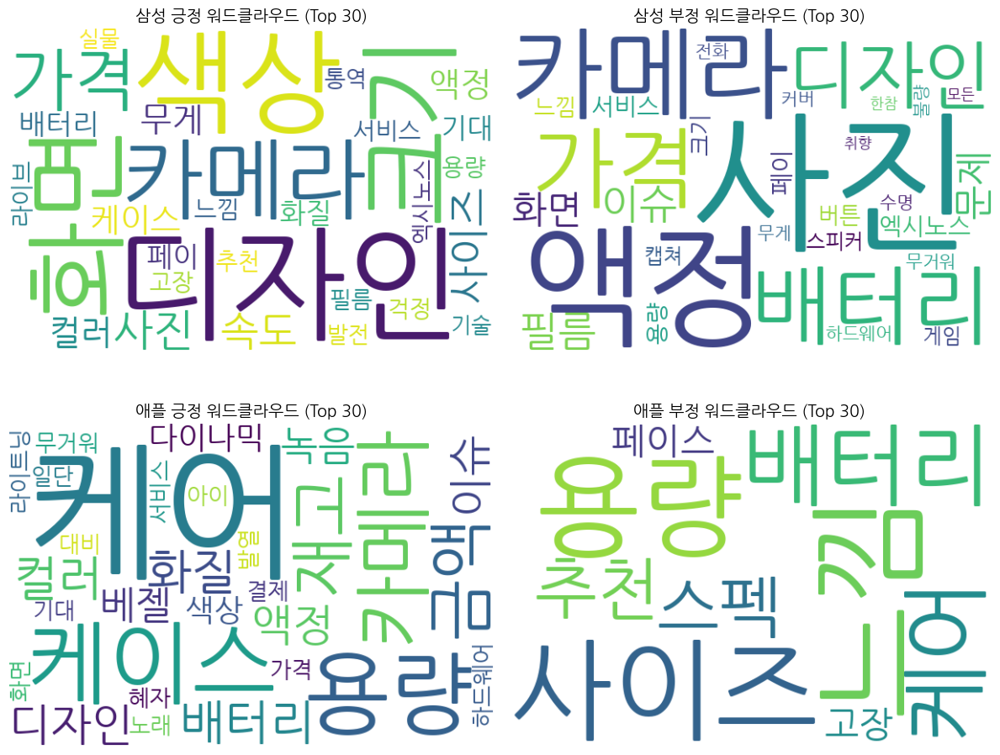

In [105]:
custom_stopwords = ['갤럭시', '이벤트', '휴대폰', '진짜' ,'역시', '더', '아주', '플러스', '배송', '울트라',
                   '어머니', '기존', '매우', '완전', '기본', '삼성', '전자', '핸드폰', '원래', '처음', '아이폰',
                   '다시', '자급', '사용','시리즈', '구매', '반품', '이번', '계속', '하면', '구입', '참여', '선물', '지금', '제품',
                   '가장', '차이', '생각', '매장', '신세계', '보고', '정말', '마음', '고민', '최고', '스마트폰', '이전', '변경',
                   '데이터', '픽업', '기능', '성능', '듭니', '항상', '혜택', '제일', '만족', '비교', '가지' ,'사은', '주문', '선택', 
                    '센터', '다행', '굳이', '부분', '한지', '상황', '개인', '기준', '모델', '정도', '무엇', '부분', '후회', '어차피', '거듭',
                    '타입', '반값', '사전예약', '가지', '커서', '고객', '문의', '이제', '강남','투폰', '반면', '안남', '전혀', '율도', '햐긴참',
                   '사실', '하이마트', '제약', '그레이', '제로', '결정', '엣지', '홈페이지', '제로', '하나', '별로', '안테나', '프로', '조건', 
                   '택배', '스마트스토어', '나날이', '최근', '신사', '대박', '자꾸', '줄라', '마린', '자꾸', '아이디', '바람', '잔고', '적응',
                   '때문', '그냥', '동시', '사이트', '쿠통', '보급', '먼저', '할인', '애플', '베이지', '블랙', '스스로', '스토어', '가입', '태그',
                   '하니', '지원', '개통', '가입', '계획', '핑크', '베스', '합의', '신청', '공홈', '보이', '출시', '카드', '최신', '블루', '맥스',
                   '옐로우', '쿠폰', '플립', '차별', '노트', '다음', '추가', '교체', '직접', '부가', '중소기업', '전용' ,'스마트', '안드로이드', '살짝',
                   '공식', '우선', '가족', '일반', '어쨌든', '지향', '적용', '평가', '달달', '경로', '판매', '한국', '안내', '정품', '마침', '제공',
                   '하루', '처럼', '사람', '온라인', '소비자', '이자', '상이', '쓰기', '개월', '적립', '행사', '어플', '엘지', '민팃', '확장', '대기',
                   '컨트롤', '사고', '안해', '예전', '세이프', '구한', '정신승리', '평생', '매직', '계열',]

def generate_wordclouds(pos_neg_dict, stopwords, top_n=30):
    """
    워드클라우드 4개 (삼성/애플, 긍정/부정)를 한 번에 시각화하는 함수
    :param pos_neg_dict: {'label': pd.Series of nouns}
    :param stopwords: list of stopwords to filter
    :param top_n: number of top keywords to show
    """
    plt.figure(figsize=(12, 10))

    for idx, (label, noun_series) in enumerate(pos_neg_dict.items(), 1):
        # 1. 텍스트 결합
        text = ' '.join(noun_series.dropna())
        word_list = text.split()
        
        # 2. 불용어 + 한 글자 단어 제거
        filtered_words = [word for word in word_list if word not in stopwords and len(word) > 1]
        
        # 3. 상위 단어 추출
        word_counts = Counter(filtered_words)
        top_words = dict(word_counts.most_common(top_n))
        
        # 4. 워드클라우드 생성
        wordcloud = WordCloud(
            background_color='white',
            font_path='/usr/share/fonts/truetype/nanum/NanumGothic.ttf',
            width=600,
            height=400
        ).generate_from_frequencies(top_words)
        
        # 5. 시각화
        plt.subplot(2, 2, idx)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"{label} 워드클라우드 (Top {top_n})", fontsize=14)
    
    plt.tight_layout()
    plt.show()

pos_neg_dict = {
    "삼성 긍정": df_samsung[df_samsung['sentiment_label'] == '1']['noun'],
    "삼성 부정": df_samsung[df_samsung['sentiment_label'] == '0']['noun'],
    "애플 긍정": df_apple[df_apple['sentiment_label'] == '1']['noun'],
    "애플 부정": df_apple[df_apple['sentiment_label'] == '0']['noun'],
}

# 실행
generate_wordclouds(pos_neg_dict, custom_stopwords)

In [106]:
def plotly_wordcloud(word_freq, title):
    wc = WordCloud(
        background_color='white',
        font_path='/usr/share/fonts/truetype/nanum/NanumGothic.ttf',
        width=800,
        height=400
    ).generate_from_frequencies(word_freq)

    wc_image = wc.to_array()

    fig = px.imshow(wc_image)
    fig.update_layout(title=title, margin=dict(l=10, r=10, t=40, b=10))
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    fig.show()
    
text = ' '.join(df_samsung[df_samsung['sentiment_label'] == '1']['noun'].dropna())
word_list = text.split()
filtered_words = [word for word in word_list if word not in custom_stopwords and len(word) > 1]
word_counts = Counter(filtered_words)
top30 = dict(word_counts.most_common(30))

plotly_wordcloud(top30, "삼성 긍정 워드클라우드 (Plotly)")